# Multi-Label Medical Image Classification Using PyTorch

<img src="https://learnopencv.com/wp-content/uploads/2023/07/medical_multi-label_feature_Image.png">

In the pivotal field of medical diagnostics, swift and accurate image classification plays a crucial role in aiding healthcare professionals' decision-making. The advent of deep learning, coupled with potent frameworks like PyTorch, has made it possible to apply leading-edge models to tackle complex tasks such as medical multi-label image classification. In this demonstration, we will employ a subset of the "Human Protein Atlas Image Classification" dataset from Kaggle to showcase these concepts and tackle a related challenge.

We will explore the use of PyTorch in conjunction with the widely-used pytorch-lightning library to fine-tune the pre-trained EfficientNetv2 model from torchvision. Additionally, we will demonstrate how to create a Gradio application for model inference.

## Table of Contents


*   <span>[1 Install & Import Necessary Libraries](#1-Install-&-Import-Necessary-Libraries)</span>
*   <span>[2 Dataset & Base Configurations](#2-Dataset-&-Base-Configurations)</span>
*   <span>[3 Medical Multi-Label Dataset Preparation](#3-Medical-Multi-Label-Dataset-Preparation)</span>
    *   <span>[3.1 Visualize Images From Each Class](#3.1-Visualize-Images-From-Each-Class)</span>
    *   <span>[3.2 Dataset Helper Functions](#3.2-Dataset-Helper-Functions)</span>
    *   <span>[3.3 Custom LightningDataModule Class To Load The Medical Multi-Label Dataset](#3.3-Custom-LightningDataModule-Class-To-Load-The-Medical-Multi-Label-Dataset)</span>
    *   <span>[3.4 Visualize Dataset](#3.4-Visualize-Dataset)</span>
*   <span>[4 Initialize PreTrained TorchVision Model](#4-Initialize-PreTrained-TorchVision-Model)</span>
*   <span>[5 Creating A Custom LightningModule Class](#5-Creating-A-Custom-LightningModule-Class)</span>
    *   <span>[5.1 Scoring Mechanism](#5.1-Scoring-Mechanism)</span>
    *   <span>[5.2 ProteinModel Class](#5.2-ProteinModel-Class)</span>
*   <span>[6 Begin Training](#6-Begin-Training)</span>
*   <span>[7 Inference](#7-Inference)</span>
*   <span>[8 Summary](#8-Summary)</span>


In this notebook, we will focus solely on coding part of the blog post. We will create the pipeline using `pytorch-lightning`. We are using `lightning` because it removes all the boilerplate code that one would need to write in every project. Some of the benefits we experienced when using it for the project are

1. Better code structuring.
2. No need to write additional code for checkpoints or learning rate monitoring.
3. Easily train with a distributed setting. For e.g., We trained the model on a 2x 3090 GPU system on the cloud to speed up training.
4. No need to write training loops or additional mixed-precision training code.
5. No need to write custom tensorboard logging code.

The entire pipeline consists of 3 main components.

1. Creating a custom `ProteinDataModule` inherited from `LightningDataModule` class. This class will contain all the required code related to downloading & creating datasets and dataloaders.

2. Initializing a pre-trained model. The model can be loaded from anywhere. We use the pre-trained `EfficientNetv2-small` model trained on (384x384) image size for this project.

3. Creating a custom `ProteinModel` class inherited from `LightningModule` class. This class will hold all the code regarding training, evaluation, initializing optimizers, and any learning rate schedulers.

In [30]:
!nvidia-smi

Sat Oct  5 17:59:06 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.94                 Driver Version: 560.94         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050      WDDM  |   00000000:01:00.0  On |                  N/A |
| 41%   55C    P8             14W /  130W |    1012MiB /   8192MiB |     13%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 1 Install & Import Necessary Libraries

In [2]:
# # Uncomment the lines below to install required packages.
# !pip install -qqqU kaggle torchinfo lightning==2.0.1 torchmetrics==1.0.0
# !pip install -qqq requests opencv-contrib-python tqdm tensorboard scikit-learn seaborn gradio

In [32]:
import os
import shutil
import zipfile
import warnings
import platform
import requests
from glob import glob
from itertools import chain
from collections import Counter
from dataclasses import dataclass

import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import matplotlib.pyplot as plt
# from sklearn.utils.class_weight import compute_class_weight

# Next, we have our usual torch and torchvision imports.
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torchvision
import torchvision.transforms as TF
from torchvision.utils import make_grid
from torchvision.ops import sigmoid_focal_loss

# Importing lighting along with a built-in callback it provides.
import lightning.pytorch as pl
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint

# Importing torchmetrics modular and functional evaluation implementations.
from torchmetrics import MeanMetric
from torchmetrics.classification import MultilabelF1Score

# To print model summary.
from torchinfo import summary

In [33]:
# Sets the internal precision of float32 matrix multiplications.
torch.set_float32_matmul_precision('high')

# To enable determinism.
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"

# Filter userwarnings.
warnings.filterwarnings(action="ignore", category=UserWarning)

# Set Seaborn color palette
sns.set_palette(sns.color_palette("rocket_r"))

# To render the matplotlib figure in the notebook.
%matplotlib inline

## 2 Dataset & Base Configurations

First, we define the root location where we want to download the dataset. The location for the rest of the folders, such as training and test set images, will use this location as the base path.

In [34]:
# Set root path where dataset will be downloaded. 
# Every other path to the folder or files in the datasets, 
# will have this as it's root

ROOT_PATH = os.path.join('D:\Datasets', "datasets")
print(ROOT_PATH)

D:\Datasets\datasets


Next, we'll declare all the hyperparameters used in the project. 

In [7]:
@dataclass
class DatasetConfig:
    IMAGE_SIZE:  tuple = (384, 384) # (W, H)
    CHANNELS:      int = 3
    NUM_CLASSES:   int = 10
    VALID_PCT:    float = 0.1        
        
    # Pre-defined MEAN & STD. DEV.of the Imagenet trained model.
    MEAN:        tuple = (0.485, 0.456, 0.406)
    STD:         tuple = (0.229, 0.224, 0.225)
    
    # Dataset file and folder paths.
    TRAIN_IMG_DIR: str = os.path.join(ROOT_PATH, "Human protein atlas", "train")
    TEST_IMG_DIR:  str = os.path.join(ROOT_PATH, "Human protein atlas", "test")
    TRAIN_CSV:     str = os.path.join(ROOT_PATH, "Human protein atlas", "train.csv")
    TEST_CSV:      str = os.path.join(ROOT_PATH, "submission.csv")


@dataclass
class TrainingConfig:
    BATCH_SIZE:      int = 16 # 32, Reduce batch size in case of OOM error.
    NUM_EPOCHS:      int = 10
    INIT_LR:       float = 1e-4
    NUM_WORKERS:     int = 0 if platform.system() == "Windows" else os.cpu_count()  
    OPTIMIZER_NAME:  str = "Adam"
    WEIGHT_DECAY:  float = 1e-4 
    USE_SCHEDULER:  bool = True # Use learning rate scheduler?
    SCHEDULER:       str = "multi_step_lr" # Name of the scheduler to use.
    METRIC_THRESH: float = 0.4 
    MODEL_NAME:      str = "efficientnet_v2_s" # "efficientnet_v2_s"
    FREEZE_BACKBONE:bool = False

## 3 Medical Multi-Label Dataset Preparation

1. `labels` is a dictionary mapping class ID's to their string representataions.

2. `rev` is a dictionary mapping that maps class names in string format to class ID's. 

In [8]:
labels = {
    0: 'Mitochondria',
    1: 'Nuclear bodies',
    2: 'Nucleoli',
    3: 'Golgi apparatus',
    4: 'Nucleoplasm',
    5: 'Nucleoli fibrillar center',
    6: 'Cytosol',
    7: 'Plasma membrane',
    8: 'Centrosome',
    9: 'Nuclear speckles'
}

rev = {item: key for key, item in labels.items()}

### 3.1 Visualize Images From Each Class

In interest of time, we've already created a folder which contains images that contain only a single class.

In [9]:
# Download sample images with only one class per image.

URL = r"https://www.dropbox.com/scl/fi/caktugsvdbhnjoju5j78q/per_class_imgs.zip?rlkey=fu7q7fgpbrclxldq0xq9r2leb&dl=1"

file = requests.get(URL)
open("per_class_imgs.zip", "wb").write(file.content)

with zipfile.ZipFile("per_class_imgs.zip") as f:
    f.extractall(".")

Plot images

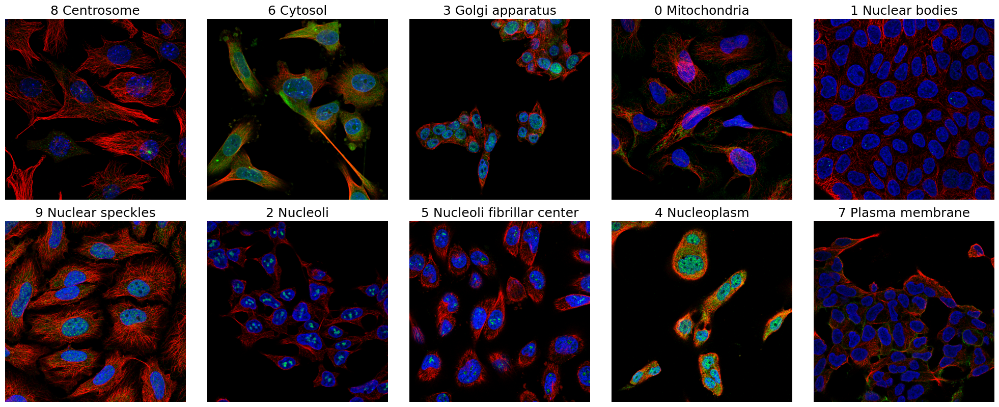

In [10]:
imgs = []
cls_names = []


for directory, _, files in os.walk("per_class_imgs"):
    if not len(files):
        continue
        
    class_name = os.path.split(directory)[-1]
    class_imgs = glob(directory + os.sep + "*.png")
    
    file = np.random.choice(class_imgs, size=1, replace=False)[0]

    image = Image.open(file).convert("RGB")
    image = np.asarray(image.resize((512, 512)))
    
    imgs.append(image)
    cls_names.append(class_name)
    
    
plt.figure(figsize=(20, 20))

for idx, (image, cls_name) in enumerate(zip(imgs, cls_names), 1):
    plt.subplot(5, 5, idx)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"{rev[cls_name]} {cls_name}", fontsize=18)
    
plt.tight_layout()
plt.show()

### 3.2 Dataset Helper Functions

Before we begin writing our own custom LightningModule class, we need some additional helper functions and classes for the following tasks:


1. `encode_label(...)` : This function converts labels in string format into a vector of 0’s and 1’s depending on the provided label. For example, `"1 3 5" → [0, 1, 0, 1, 0, 1, 0, 0, 0, 0]`

2. `decode_target(...)`:  This function converts the model’s prediction from a vector of probabilities to a string of integers (`"1 4 5"`) or their string (class names) representations.

3. `denormalize(...)`: This function is used to denormalize the image tensors and clip values between 0 and 1. It is helpful during image visualizations.

In [11]:
def encode_label(label: list, num_classes=10):
    """This functions converts labels into multi-hot encoding"""

    target = torch.zeros(num_classes)
    for l in str(label).split(" "):
        target[int(l)] = 1.0
    return target


def decode_target(
    target: list,
    text_labels: bool = False,
    threshold: float = 0.4,
    cls_labels: dict = None,
):
    """This function converts the labels from
    probablities to outputs or string representations
    """

    result = []
    for i, x in enumerate(target):
        if x >= threshold:
            if text_labels:
                result.append(cls_labels[i] + "(" + str(i) + ")")
            else:
                result.append(str(i))
    return " ".join(result)


# This function is used for reversing the Normalization step performed 
# during image preprocessing.
# Note the mean and std values must match the ones used.

def denormalize(tensors, *, mean, std):
    """Denormalizes image tensors using mean and std provided
    and clip values between 0 and 1"""

    for c in range(DatasetConfig.CHANNELS):
        tensors[:, c, :, :].mul_(std[c]).add_(mean[c])

    return torch.clamp(tensors, min=0.0, max=1.0)

Next, we need to define a custom PyTorch `Dataset` class: `HumanProteinDataset`


This is a custom PyTorch `Dataset` class designed to load images and labels (if available) for each set. The PyTorch `"Dataset"` class is essential for efficient and organized data handling in machine learning tasks. It provides a standardized interface to load and preprocess data samples from various sources. Encapsulating the dataset into a single object simplifies data management and enables seamless integration with other PyTorch components like data loaders and models. 

In [12]:
class HumanProteinDataset(Dataset):
    """
    Parse raw data to form a Dataset of (X, y).
    """

    def __init__(self, *, df, root_dir, img_size, transforms=None, is_test=False):
        self.df = df
        self.root_dir = root_dir
        self.img_size = img_size
        self.transforms = transforms
        self.is_test = is_test

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.loc[idx]
        img_id = row["Image"]
        img_fname = self.root_dir + os.sep + str(img_id) + ".png"
        
        img = Image.open(img_fname).convert("RGB")
        img = img.resize(self.img_size, resample=3)
        img = self.transforms(img)
        
        if self.is_test:
            return img, img_id
    
        return img, encode_label(row["Label"])

### 3.3 Custom LightningDataModule Class To Load The Medical Multi-Label Dataset

The first primary class we define is the `ProteinDataModule` class which inherits from Lightning’s `LightningDataModule` class. The custom class encapsulates the following steps:

1. Download the dataset from Kaggle.
2. Create train and validation splits.
3. Create a Dataset class object for each split with appropriate transformations.
4. Create DataLoader objects for each split.


The class methods are defined to do the following tasks:

1. `prepare_data(..)`: This method is used for data preparation, like downloading and one-time preprocessing with the dataset. When training on a distributed GPU, this will be called from a single GPU.
2. `setup(...)`:  When you want to perform data operations on every GPU, this method is apt for it will call from every GPU. For example, perform train/val/test splits.

3. `train_dataloader(...)`: This method returns the train dataloader.

4. `val_dataloader(...)`: This method returns validation dataloader(s).

5. `test_dataloader(...)`:  This method returns test dataloader(s).

---

**Note:** Please ensure that your Kaggle credential files `kaggle.json` is either available in the root user path. 

```python
# Get kaggle user folder location in your machine.
KAGGLE_DIR = os.path.join(os.path.expanduser("~"), ".kaggle")
print(KAGGLE_DIR)
```

If it's available, you can download your credentials (JSON) file from your Kaggle account. Go to your Kaggle Profile >> Go to the Account tabs >> Click on *Create New Token*. Save the file in the current working directory, and the `prepare_data(..)` method will automatically move the file to the required location for you.

In [13]:
class ProteinDataModule(pl.LightningDataModule):
    def __init__(
        self,
        *,
        num_classes=10,
        valid_pct=0.1,
        resize_to=(384, 384),
        batch_size=32,
        num_workers=0,
        pin_memory=False,
        shuffle_validation=False,
    ):
        super().__init__()

        self.num_classes = num_classes
        self.valid_pct = valid_pct
        self.resize_to = resize_to
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.pin_memory = pin_memory
        self.shuffle_validation = shuffle_validation

        self.train_tfs = TF.Compose(
            [
                TF.RandomAffine(
                    degrees=40,
                    translate=(0.01, 0.12),
                    shear=0.05,
                ),
                TF.RandomHorizontalFlip(),
                TF.RandomVerticalFlip(),
                TF.ToTensor(),
                TF.Normalize(DatasetConfig.MEAN, DatasetConfig.STD, inplace=True),
                TF.RandomErasing(inplace=True),
            ]
        )

        self.valid_tfs = TF.Compose(
            [
                TF.ToTensor(),
                TF.Normalize(DatasetConfig.MEAN, DatasetConfig.STD, inplace=True),
            ]
        )
        self.test_tfs = self.valid_tfs


    def prepare_data(self):
        # Download dataset.
        if not os.path.exists(os.path.join(DatasetConfig.TRAIN_CSV)):
            KAGGLE_DIR = os.path.join(os.path.expanduser("~"), ".kaggle")
            KAGGLE_JSON_PATH = os.path.join(KAGGLE_DIR, "kaggle.json")

            if not os.path.exists(KAGGLE_JSON_PATH):
                os.makedirs(KAGGLE_DIR, exist_ok=True)
                shutil.copyfile("kaggle.json", KAGGLE_JSON_PATH)
                os.chmod(KAGGLE_JSON_PATH, 0o600)

            # print("Downloading 512x512 sized dataset...", end="")
            # !kaggle datasets download -q aakashns/jovian-pytorch-z2g -p datasets --unzip

            print("Downloading 384x384 sized dataset...", end="")
            !kaggle datasets download -q learnopencvblog/human-protein-atlas-384x384 -p {ROOT_PATH} --unzip
            print("Done")

    def setup(self, stage=None):
        np.random.seed(42)
        data_df = pd.read_csv(DatasetConfig.TRAIN_CSV)
        msk = np.random.rand(len(data_df)) < (1.0 - self.valid_pct)
        train_df = data_df[msk].reset_index()
        valid_df = data_df[~msk].reset_index()

        # train_labels = list(chain.from_iterable([i.strip().split(" ") for i in train_df["Label"].values]))
        # class_weights = compute_class_weight("balanced", classes=list(range(self.num_classes)), 
        #                                      y=[int(i) for i in train_labels])
        # self.class_weights = torch.tensor(class_weights)

        img_size = DatasetConfig.IMAGE_SIZE
        self.train_ds = HumanProteinDataset(
            df=train_df, img_size=img_size, root_dir=DatasetConfig.TRAIN_IMG_DIR, transforms=self.train_tfs
        )

        self.valid_ds = HumanProteinDataset(
            df=valid_df, img_size=img_size, root_dir=DatasetConfig.TRAIN_IMG_DIR, transforms=self.valid_tfs
        )

        test_df = pd.read_csv(DatasetConfig.TEST_CSV)
        self.test_ds = HumanProteinDataset(
            df=test_df, img_size=img_size, root_dir=DatasetConfig.TEST_IMG_DIR, transforms=self.test_tfs, is_test=True
        )

        print(f"Number of images :: Training: {len(self.train_ds)}, Validation: {len(self.valid_ds)}, Testing: {len(self.test_ds)}\n")

    def train_dataloader(self):
        # Create a train dataloader.
        train_loader = DataLoader(
            self.train_ds, batch_size=self.batch_size, pin_memory=self.pin_memory, shuffle=True, num_workers=self.num_workers
        )
        return train_loader

    def val_dataloader(self):
        # Create validation dataloader object.
        valid_loader = DataLoader(
            self.valid_ds, batch_size=self.batch_size, pin_memory=self.pin_memory, 
            shuffle=self.shuffle_validation, num_workers=self.num_workers
        )
        return valid_loader

    def test_dataloader(self):
        # Create test dataloader object.
        test_loader = DataLoader(
            self.test_ds, batch_size=self.batch_size, pin_memory=self.pin_memory, shuffle=False, num_workers=self.num_workers
        )
        return test_loaderhttps://github.com/github-copilot/code_referencing?cursor=f4446588afe385284a7bfa39dedbfd69&editor=vscode

Let's create an instance of the `ProteinDataModule`. Then by manually calling the `prepare_data(...)` will download the dataset in the specified location. We are doing so to generate some visualization of the dataset. If suppose we skip the next few code cells for visualization and directly start training. The `prepare_data(...)` and `setup(...)` methods will be called automatically by `Lightning`. 

In [14]:
%%time

dm = ProteinDataModule(
    num_classes=DatasetConfig.NUM_CLASSES,
    batch_size=32, 
    num_workers=0
)

# Donwload dataset.
dm.prepare_data()

# Split datset into training, validation set.
dm.setup()

Number of images :: Training: 17335, Validation: 1901, Testing: 8243

CPU times: total: 0 ns
Wall time: 38.4 ms


Load the original `train.csv` file.

In [15]:
data_df = pd.read_csv(DatasetConfig.TRAIN_CSV)
data_df.head()

,Image,Label
0,19567,9
1,29993,6 4
2,17186,1 4
3,29600,6 2
4,701,3 4


Get the class `counts` and also plot the distribution. 

In [16]:
all_labels = list(chain.from_iterable([i.strip().split(" ") for i in data_df["Label"].values]))
c_val = Counter(all_labels)

n_keys = c_val.keys()
max_idx = max(n_keys)

counts = pd.DataFrame(
    {
        
        "Label": [labels[int(key)] for key in c_val.keys()],
        "Count": [val for val in c_val.values()],
    }
)

rev_label2id = {value: key for key, value in labels.items()}
counts["Class ID"]  = [rev_label2id[label] for label in counts["Label"]]
counts = counts.set_index("Class ID")

counts = counts.sort_values(by="Count", ascending=False)
counts.style.background_gradient(cmap="Reds")

,Label,Count
Class ID,,
4,Nucleoplasm,9066
6,Cytosol,5711
7,Plasma membrane,2629
2,Nucleoli,2542
0,Mitochondria,2088
3,Golgi apparatus,1977
1,Nuclear bodies,1752
9,Nuclear speckles,1278
5,Nucleoli fibrillar center,1109


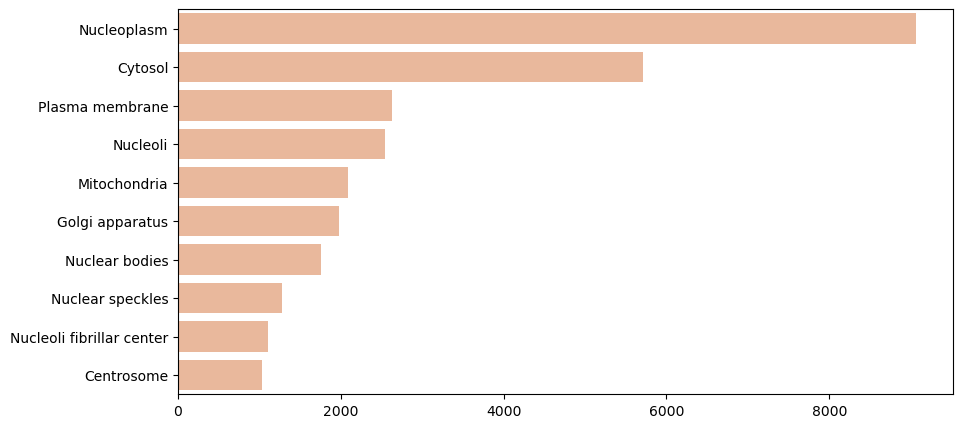

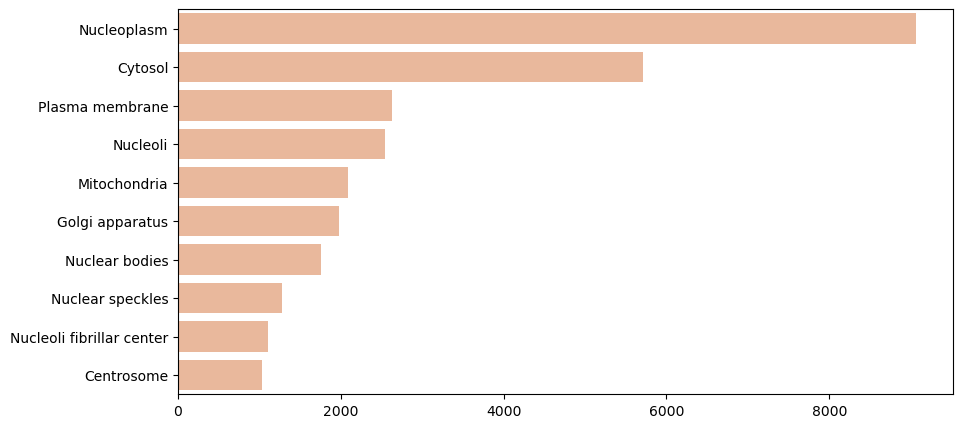

In [19]:
plt.figure(figsize=(10,5))
sns.barplot(y=counts["Label"].values, x=counts["Count"].values, order=counts["Label"].values);
plt.show()

### 3.4 Visualize Dataset

In [20]:
# Get the validation data loader.

valid_loader = dm.val_dataloader()

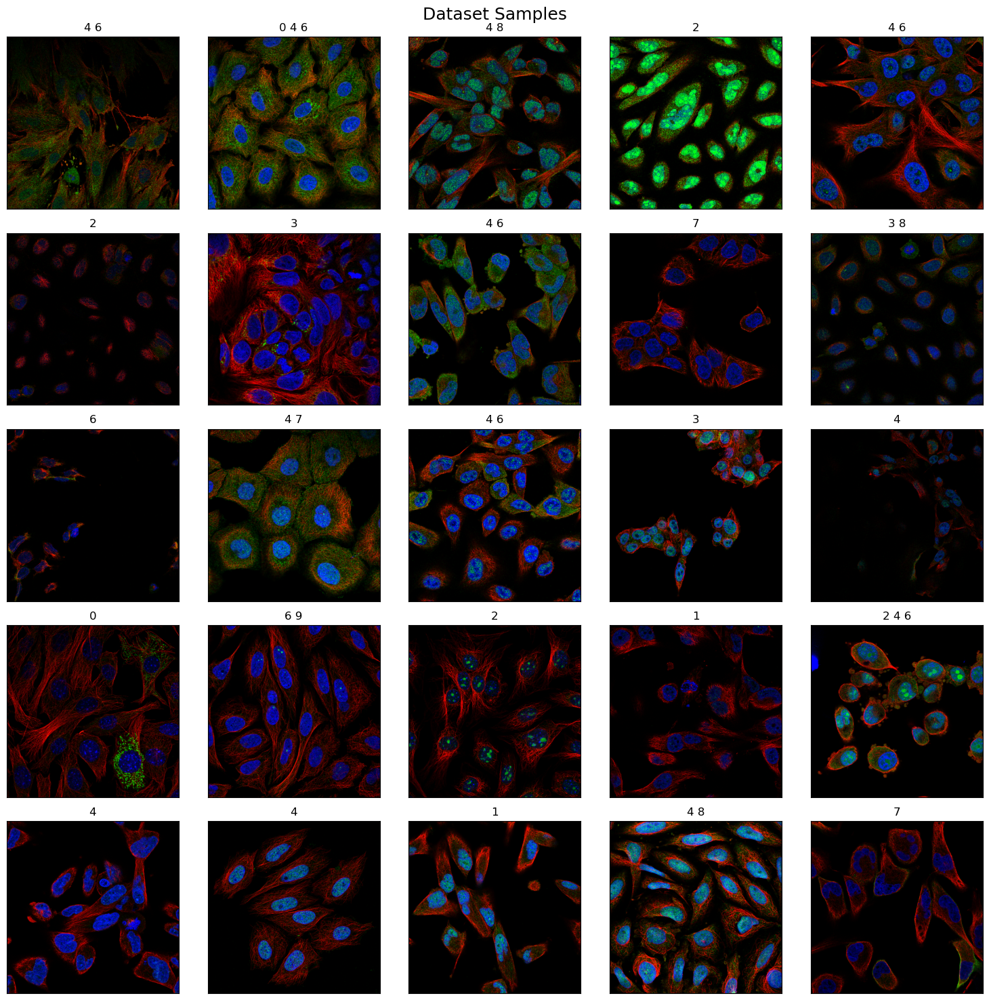

In [21]:
plt.figure(figsize=(15, 15))

for X, y in valid_loader:

    images = denormalize(X, mean=DatasetConfig.MEAN, std=DatasetConfig.STD).permute(0, 2, 3, 1).numpy()
    targets = y.numpy()


    for i in range(1, 26):
        plt.subplot(5, 5, i)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i])

        target = " ".join([str(idx) for idx, cls_id in enumerate(targets[i]) if cls_id])
        plt.title(f"{target}", fontsize=12)

    plt.suptitle('Dataset Samples', fontsize=18)
    plt.tight_layout()
    plt.show()
    plt.close()
    break

We'll also generate a grid of images just for visualization purposes. To do so, we'll use the `make_grid(...)` function available in `torchvision`.

In [22]:
dm.batch_size = 132
dm.resize_to = (128, 128)
valid_loader = dm.val_dataloader()

batch = next(iter(valid_loader))
images = denormalize(batch[0], mean=DatasetConfig.MEAN, std=DatasetConfig.STD)

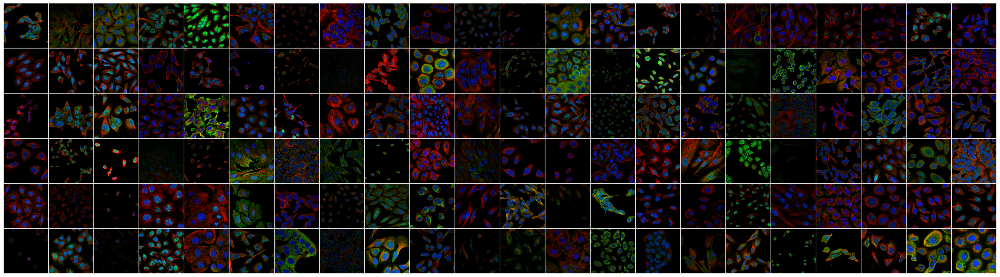

In [23]:
plt.figure(figsize=(32, 32))

grid_img = make_grid(images, nrow=22, padding=5, pad_value=1.0)

plt.imshow(grid_img.permute(1, 2, 0))
plt.axis("off")
plt.savefig("medical_images_grid.png", bbox_inches='tight')
plt.tight_layout()
plt.show()
plt.close;

## 4 Initialize PreTrained TorchVision Model

In this section, we define a helper function capable of loading any classification model available in Torchvision. All you need to do is pass the following:

1. The correct `model_name`. For e.g. “resnet50” for the ResNet-50 model, “mobilenet_v3_large” for the MobileNetV3-Large model.

2. `num_classes`: The number of nodes in the output layer of the model.

3. `freeze_backbone`: Whether to freeze the rest of the parameters of the model.

In [24]:
def get_model(model_name: str, num_classes: int, freeze_backbone: bool= True):
    """A helper function to load and prepare any classification model 
    available in Torchvision for transfer learning or fine-tuning."""
    
    model = getattr(torchvision.models, model_name)(weights="DEFAULT")
    
    if freeze_backbone:
        # Set all layer to be non-trainable
        for param in model.parameters():
            param.requires_grad = False
        
    model_childrens = [name for name, _ in model.named_children()]

    try:
        final_layer_in_features = getattr(model, f"{model_childrens[-1]}")[-1].in_features
    except Exception as e:
        final_layer_in_features = getattr(model, f"{model_childrens[-1]}").in_features

    new_output_layer = nn.Linear(
        in_features=final_layer_in_features, 
        out_features=num_classes
    )
    
    try:
        getattr(model, f"{model_childrens[-1]}")[-1] = new_output_layer
    except:
        setattr(model, model_childrens[-1], new_output_layer)
    
    return model

**Function usage example:**

In [25]:
model = get_model(
    model_name=TrainingConfig.MODEL_NAME, 
    num_classes=DatasetConfig.NUM_CLASSES,
    freeze_backbone=False,
)

summary(
    model, 
    input_size=(1, DatasetConfig.CHANNELS, *DatasetConfig.IMAGE_SIZE[::-1]), 
    depth=2, 
    device="cpu", 
    col_names=["output_size", "num_params", "trainable"]
)

Layer (type:depth-idx)                                  Output Shape              Param #                   Trainable
EfficientNet                                            [1, 10]                   --                        True
├─Sequential: 1-1                                       [1, 1280, 12, 12]         --                        True
│    └─Conv2dNormActivation: 2-1                        [1, 24, 192, 192]         696                       True
│    └─Sequential: 2-2                                  [1, 24, 192, 192]         10,464                    True
│    └─Sequential: 2-3                                  [1, 48, 96, 96]           303,552                   True
│    └─Sequential: 2-4                                  [1, 64, 48, 48]           589,184                   True
│    └─Sequential: 2-5                                  [1, 128, 24, 24]          917,680                   True
│    └─Sequential: 2-6                                  [1, 160, 24, 24]          3,463,840

## 5 Creating A Custom LightningModule Class

The final custom class we need to define is the `ProteinModel` class which inherits from the `LightningModule` class. The  `LightningModule` class helps to properly organize the PyTorch code into separate sections for training and evaluation. 

| **#No.** | **Action**                   | **Method**                  |
|:--------:|:----------------------------:|:---------------------------:|
| 1        | Initialization               | `__init__(...)`             |
| 2        | Train Loop                   | `training_step(...)`        |
| 3        | Validation Loop              | `validation_step(...)`      |
| 4        | Test Loop                    | `test_step(...)`            |
| 5        | Prediction Loop              | `predict_step(...)`         |
| 6        | Optimizers and LR Schedulers | `configure_optimizers(...)` |



To get more information about the different methods and flags available in `LightningDataModule`, you can refer to the <a href="https://lightning.ai/docs/pytorch/stable/common/lightning_module.html" target="_blank">documentation here</a>

### 5.1 Scoring Mechanism


Before writing our custom class, it's crucial to select an appropriate evaluation metric. Due to the imbalanced nature of our dataset, relying on "accuracy" alone can be misleading. Accuracy measures the proportion of correct predictions out of all predictions made by the model.

<!-- $$\Large{F1 = \frac{2TP}{2TP+FP+FN}}$$ -->

$$\text{F1} = \frac{\text{2 * Precision * Recall} }{\text{Precision + Recall}} = \frac{\text{2TP}}{\text{2TP+FP+FN}}$$


In an imbalanced dataset, where the number of instances of one class greatly outnumbers the other, a model could achieve high accuracy simply by predicting the majority class all the time. In such cases, the `F1-score` is a commonly used metric. It is the harmonic mean of precision and recall- two fundamental measures of a model's effectiveness. Precision measures how many of the predicted positive instances are actually positive, while recall measures how many actual positive instances were correctly predicted by the model. F1 score is particularly useful when the data is imbalanced, that is when the cost of false positives and false negatives are significantly different. 

To calculate the F1 score for the medical multi-label classification task, we will use the `MultilabelF1Score` class from the `torchmetrics` library and the "`macro`" average reduction method. 

"Macro" average refers to a method of calculating average performance in multiclass or multilabel classification problems, which treats all classes equally.

### 5.2 ProteinModel Class

To summarize, for the medical multi-label dataset, we are using the following:

1. Pre-trained `efficientnet_v2_s` model.

2. `BCEWithLogitsLoss` loss.

3. `MultilabelF1Score` as the evaluation metric.

4. `Adam` optimizer.

5. `MultiStepLr` LR scheduler that decays the learning rate at the halfway point in training.

In [27]:
class ProteinModel(pl.LightningModule):
    def __init__(
        self,
        model_name: str,
        num_classes: int = 10,
        freeze_backbone: bool = False,
        init_lr: float = 0.001,
        optimizer_name: str = "Adam",
        weight_decay: float = 1e-4,
        use_scheduler: bool = False,
        f1_metric_threshold: float = 0.4,
    ):
        super().__init__()

        # Save the arguments as hyperparameters.
        self.save_hyperparameters()

        # Loading model using the function defined above.
        self.model = get_model(
            model_name=self.hparams.model_name,
            num_classes=self.hparams.num_classes,
            freeze_backbone=self.hparams.freeze_backbone,
        )

        # Intialize loss class.
        self.loss_fn = nn.BCEWithLogitsLoss()

        # Initializing the required metric objects.
        self.mean_train_loss = MeanMetric()
        self.mean_train_f1   = MultilabelF1Score(num_labels=self.hparams.num_classes, 
                                                 average="macro", threshold=self.hparams.f1_metric_threshold)
        self.mean_valid_loss = MeanMetric()
        self.mean_valid_f1   = MultilabelF1Score(num_labels=self.hparams.num_classes, 
                                                 average="macro", threshold=self.hparams.f1_metric_threshold)

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, *args, **kwargs):
        data, target = batch
        logits = self(data)
        loss = self.loss_fn(logits, target)
        
        self.mean_train_loss(loss, weight=data.shape[0])
        self.mean_train_f1(logits, target)

        self.log("train/batch_loss", self.mean_train_loss, prog_bar=True)
        self.log("train/batch_f1",   self.mean_train_f1,   prog_bar=True)
        return loss

    def on_train_epoch_end(self):
        # Computing and logging the training mean loss & mean f1.
        self.log("train/loss", self.mean_train_loss, prog_bar=True)
        self.log("train/f1",   self.mean_train_f1,   prog_bar=True)
        self.log("step", self.current_epoch)

    def validation_step(self, batch, *args, **kwargs):
        data, target = batch  # Unpacking validation dataloader tuple
        logits = self(data)
        loss = self.loss_fn(logits, target)
        
        self.mean_valid_loss.update(loss, weight=data.shape[0])
        self.mean_valid_f1.update(logits, target)

    def on_validation_epoch_end(self):
        # Computing and logging the validation mean loss & mean f1.
        self.log("valid/loss", self.mean_valid_loss, prog_bar=True)
        self.log("valid/f1",   self.mean_valid_f1,   prog_bar=True)
        self.log("step", self.current_epoch)

    def configure_optimizers(self):
        optimizer = getattr(torch.optim, self.hparams.optimizer_name)(
            filter(lambda p: p.requires_grad, self.model.parameters()),
            lr=self.hparams.init_lr,
            weight_decay=self.hparams.weight_decay,
        )

        if self.hparams.use_scheduler:
            lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(
                optimizer,
                milestones=[self.trainer.max_epochs // 2,],
                gamma=0.1,
            )

            # The lr_scheduler_config is a dictionary that contains the scheduler
            # and its associated configuration.
            lr_scheduler_config = {
                "scheduler": lr_scheduler,
                "interval": "epoch",
                "name": "multi_step_lr",
            }
            return {"optimizer": optimizer, "lr_scheduler": lr_scheduler_config}

        else:
            return optimizer

## 6 Begin Training

Once we have organized the `LightningModule` and `LightningDataModule` classes, utilizing the `Trainer` class automates the remaining tasks effortlessly. The `Trainer` offers a range of valuable deep learning training functionalities, such as mixed-precision training, distributed training, deterministic training, profiling, gradient accumulation, batch overfitting, and more. Implementing these functionalities correctly can be time-consuming, but with the `Trainer`, it becomes a swift process.

By initializing our `ProteinModel` and `ProteinDataModule` classes and passing them to the `.fit(...)` method of the `Trainer` class instance, we can promptly commence training. This streamlined approach eliminates the need for manual implementation of various training aspects, providing convenience and efficiency.

In [28]:
# Seed everything for reproducibility.
pl.seed_everything(42, workers=True)

model = ProteinModel(
    model_name=TrainingConfig.MODEL_NAME,
    num_classes=DatasetConfig.NUM_CLASSES,
    freeze_backbone=TrainingConfig.FREEZE_BACKBONE,
    init_lr=TrainingConfig.INIT_LR,
    optimizer_name=TrainingConfig.OPTIMIZER_NAME,
    weight_decay=TrainingConfig.WEIGHT_DECAY,
    use_scheduler=TrainingConfig.USE_SCHEDULER,
    f1_metric_threshold=TrainingConfig.METRIC_THRESH,
)

data_module = ProteinDataModule(
    num_classes=DatasetConfig.NUM_CLASSES,
    valid_pct=DatasetConfig.VALID_PCT,
    resize_to=DatasetConfig.IMAGE_SIZE,
    batch_size=TrainingConfig.BATCH_SIZE,
    num_workers=TrainingConfig.NUM_WORKERS,
    pin_memory=torch.cuda.is_available(),
)

# Creating ModelCheckpoint callback.
# Checkpoints by default will be saved in Trainer - default_root_dir which is "lightning_logs".
model_checkpoint = ModelCheckpoint(
    monitor="valid/f1",
    mode="max",
    filename="ckpt_{epoch:03d}-vloss_{valid/loss:.4f}_vf1_{valid/f1:.4f}", 
    auto_insert_metric_name=False,
)

# Creating a learning rate monitor callback which will be plotted/added in the default logger.
lr_rate_monitor = LearningRateMonitor(logging_interval="epoch")

Seed set to 42


To visualize and compare different runs, execute the following code cells to start TensorBoard within the notebook:

In [24]:
# # To reload tensorBoard
# %reload_ext tensorboard

# # logs folder path
# %tensorboard --logdir=lightning_logs

**Train**

In [29]:
# Initializing the Trainer class object.
# It uses 'Tensorboard' as its default logger.
trainer = pl.Trainer(
    accelerator="auto", # Auto select the best hardware accelerator available
    devices="auto", # Auto select available devices for the accelerator (For eg. mutiple GPUs)
    strategy="auto", # Auto select the distributed training strategy.
    max_epochs=TrainingConfig.NUM_EPOCHS, # Maximum number of epoch to train for.
    deterministic=True, # For deteministic and reproducible training.
    enable_model_summary=False, # Disable printing of model summary as we are using torchinfo.
    callbacks=[model_checkpoint, lr_rate_monitor],  # Declaring callbacks to use.
    precision="16", # Using Mixed Precision training.
    logger=True, # Auto generate TensorBoard logs.
)

# Start training
trainer.fit(model, data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Number of images :: Training: 17335, Validation: 1901, Testing: 8243



Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [26]:
# Get path of the best saved model.
CKPT_PATH = model_checkpoint.best_model_path

## 7 Inference

To perform inference, first, we need to load the best checkpoint saved during training. We can do it simply by executing the following:

In [27]:
model = ProteinModel.load_from_checkpoint(CKPT_PATH)

In [38]:
# Initialize trainer class for inference.
trainer = pl.Trainer(
    accelerator="gpu",
    devices=1,        
    enable_checkpointing=False,
    inference_mode=True,
)

# Run evaluation.
data_module.setup()
valid_loader = data_module.val_dataloader()
trainer.validate(model=model, dataloaders=valid_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           step            │            0.0            │
│         valid/f1          │    0.7903037071228027     │
│        valid/loss         │    0.1759219616651535     │
└───────────────────────────┴───────────────────────────┘

[{'valid/loss': 0.1759219616651535,
  'valid/f1': 0.7903037071228027,
  'step': 0.0}]

## 8 Summary

Multi-label image classification is a fundamental and necessary task in many real-world scenarios where an image may contain more than one object or feature of interest. Unlike single-label classification, where each image is associated with only one label or class, multi-label classification acknowledges the inherent complexity and variety in real-world images by allowing them to be associated with multiple labels or classes simultaneously. This is particularly relevant in various domains. For example, in medical imaging, a scan may reveal multiple conditions or observations. Similarly, in social media, a photo may contain multiple people, objects, or activities. Additionally, in the field of autonomous vehicles, a single frame of a video feed may contain cars, pedestrians, signs, and more. By recognizing and categorizing multiple elements within a single image, multi-label classification provides a more comprehensive and nuanced understanding of the visual world, enabling us to build more effective and versatile AI systems.

To summarise this article📜, we covered a comprehensive list of related topics:

1. We explored image classification, highlighting the distinction between multi-class (one label per image) and multi-label (multiple labels per image) types.

2. We emphasized the unique post-processing and loss function requirements in multi-label classification, which set it apart from traditional classifications.

3. We utilized a subset of Kaggle's "Human Protein Atlas Image Classification" challenge to illustrate medical multi-label image classification in PyTorch.

4. We streamlined our code and improve readability using the PyTorch-Lightning library, which simplifies PyTorch's complex aspects.

5.We leveraged the pre-trained EfficientNetv2-small model from torchvision as our starting point and then fine-tune it for our specific task.

6. We designed a user-friendly interface using the Gradio app, making our medical multi-label image classification model accessible to everyone.